# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:20px;">**Cat Species Recognition**</p>

<p align="center">
  <img src="https://st2.depositphotos.com/1008660/9611/i/950/depositphotos_96115196-stock-photo-five-big-wild-cats.jpg" alt="Cat Species" width="600">
  <br>
  Source : Depositphotos.com
</p>

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:8px;">**1. Introduction**</p>

**Author : Salsa Sabitha Hurriyah**
  
**Objective :**  
Computer Vision Model for Cat Species Recognition.   
  
**Data Source :**  
Kaggle : https://www.kaggle.com/datasets/juliencalenge/felidae-tiger-lion-cheetah-leopard-puma/data

**Data Overview :**  
This dataset contains images of lion, tiger, puma, cheetah, and leopard.

**Business use case :** Mobile Application Development
Cat species recognition is implemented in a mobile application designed for general users. So, a person can take a photo of a cat they see in the wild or at a zoo and use the app to identify the species. This can be a useful tool for the Tourism Industry like in zoos. With a species recognition system, zoo managers can produce a more interactive experience by providing visitors with direct information about the cat species they see.

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:10px;">**2. Import Libraries**</p>

In [98]:
# Import libraries
import os
import cv2
import glob
import random
import string
import shutil
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense,Dropout,Conv2D,MaxPooling2D,Flatten,Input,GlobalAveragePooling2D,Add
from tensorflow.keras.models import load_model

from sklearn.metrics import confusion_matrix, classification_report

import warnings
warnings.filterwarnings('ignore')

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:10px;">**3. Data Loading**</p>

In [12]:
# Path to the main dataset folder
dataset_path = "Felidae"

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:10px;">**4. Feature Engineering**</p>

In [14]:
# Create directories for train, test, and validation sets
train_dir = "train"
test_dir = "test"
val_dir = "validation"

os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# Split the dataset into train, test, and validation sets
for cls in os.listdir(dataset_path):
    # Path to current class folder
    class_path = os.path.join(dataset_path, cls)

    # Create sub-directories for current classes in train, test, and validation sets
    os.makedirs(os.path.join(train_dir, cls), exist_ok=True)
    os.makedirs(os.path.join(test_dir, cls), exist_ok=True)
    os.makedirs(os.path.join(val_dir, cls), exist_ok=True)

    # Split data into train, test, and validation sets
    images = os.listdir(class_path)
    train_images, test_val_images = train_test_split(images, test_size=0.3, random_state=42)
    test_images, val_images = train_test_split(test_val_images, test_size=0.5, random_state=42)

    # Move the image into the appropriate directory
    for img in train_images:
        src = os.path.join(class_path, img)
        dst = os.path.join(train_dir, cls, img)
        shutil.copyfile(src, dst)

    for img in test_images:
        src = os.path.join(class_path, img)
        dst = os.path.join(test_dir, cls, img)
        shutil.copyfile(src, dst)

    for img in val_images:
        src = os.path.join(class_path, img)
        dst = os.path.join(val_dir, cls, img)
        shutil.copyfile(src, dst)

print("The dataset has been split into train, test, and validation sets.")

The dataset has been split into train, test, and validation sets.


In [15]:
# Function to see the amount of data for each class
def check_path(path):
    labels = os.listdir(path)
    labels = [label for label in labels if label != '.DS_Store']
    for label in labels:
        num_data = len(os.listdir(os.path.join(path, label)))
        print(f'Total Data - {label} : {num_data}')

print('Train Path')
check_path(train_dir)
print('')

print('Val Path')
check_path(val_dir)
print('')

print('Test Path')
check_path(test_dir)


Train Path
Total Data - Puma : 28
Total Data - Leopard : 35
Total Data - Tiger : 33
Total Data - Cheetah : 39
Total Data - Lion : 34

Val Path
Total Data - Puma : 6
Total Data - Leopard : 8
Total Data - Tiger : 8
Total Data - Cheetah : 9
Total Data - Lion : 8

Test Path
Total Data - Puma : 6
Total Data - Leopard : 7
Total Data - Tiger : 7
Total Data - Cheetah : 8
Total Data - Lion : 7


**Explanation :**  

The class that has the largest amount of data is Cheetah and the one with the least is Puma. The difference in the amount of data is quite large (unbalanced data) so it might have an effect on the model.

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:10px;">**5. Exploratory Data Analysis (EDA)**</p>

### **5.1 Displays a visualization of the amount of data for each Class**

In [32]:
# Function to display a visualization of the amount of data for each class
def visual_path(path):
    labels = os.listdir(path)
    label_names = []
    num_data = []
    for label in labels:
        label_names.append(label)
        num_data.append(len(os.listdir(os.path.join(path, label))))

    # Create a bar plot
    plt.figure(figsize=(8, 5))
    plt.bar(label_names, num_data, color='pink')
    plt.xlabel('Label')
    plt.ylabel('Number of Data')
    plt.title(f'Number of Data for Each Label in {os.path.basename(path)} Set')
    plt.xticks()
    plt.tight_layout()
    plt.show()

    return label_names, num_data

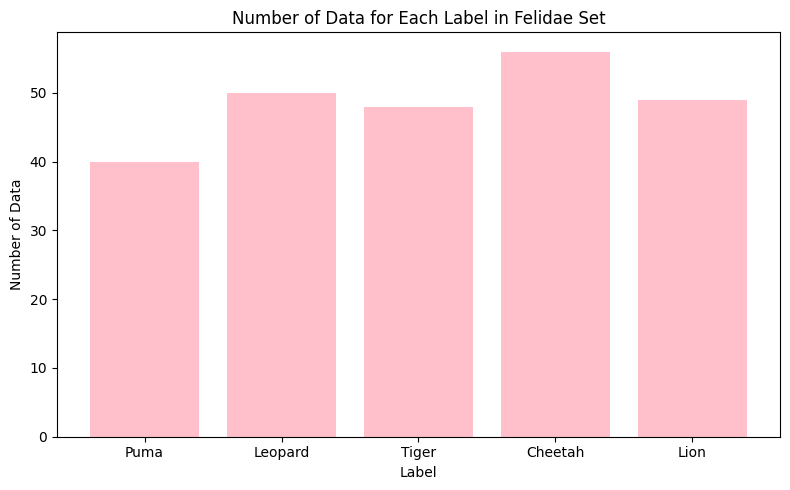

In [33]:
# Displays a visualization of the amount of data for each class in the Dataset
label_names, num_data = visual_path(dataset_path)

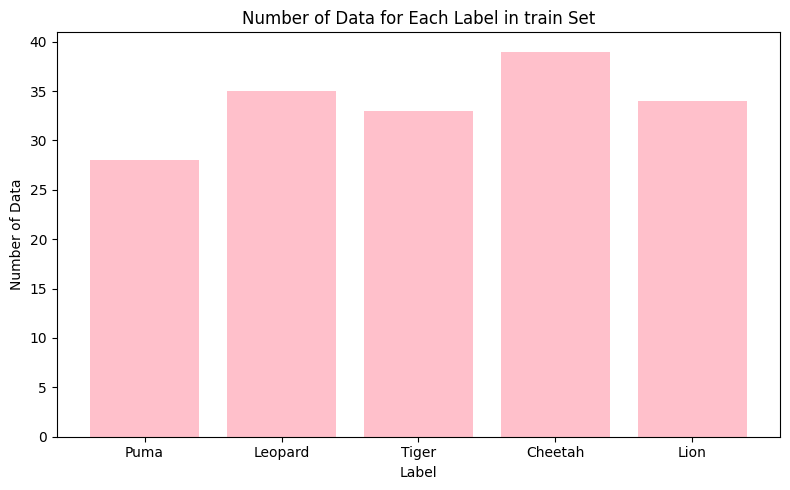

In [34]:
# Displays a visualization of the amount of data for each class in the Train Set
label_names, num_data = visual_path(train_dir)

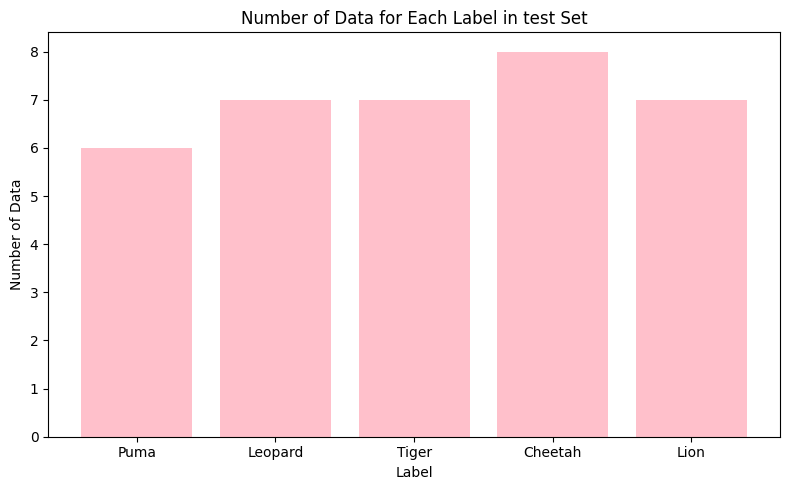

In [35]:
# Displays a visualization of the amount of data for each class in the Test Set
label_names, num_data = visual_path(test_dir)

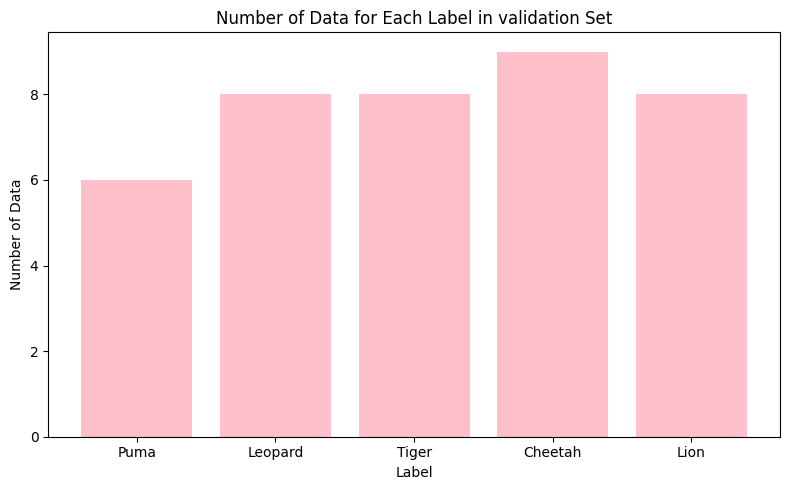

In [36]:
# Displays a visualization of the amount of data for each class in the Val Set
label_names, num_data = visual_path(val_dir)

### **5.2 Displays images for each Class**

In [21]:
# Function to display a visualization of the first 5 images from each class
def plot_images(path):
  labels = os.listdir(path)
  for label in labels:
    folder_path = os.path.join(path, label)
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 1
    print('Class : ', label)
    images = os.listdir(folder_path)
    for index in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, index)
        image = plt.imread(os.path.join(folder_path, images[index]))
        plt.imshow(image)
        plt.axis("off")
    plt.show()

Class :  Puma


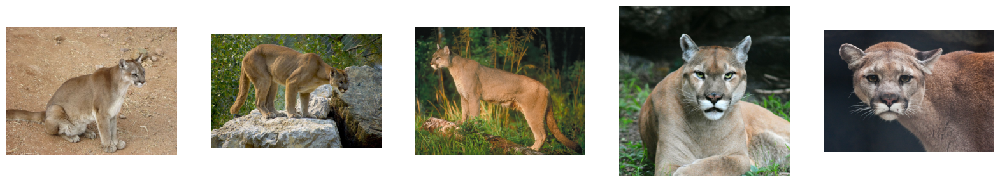

Class :  Leopard


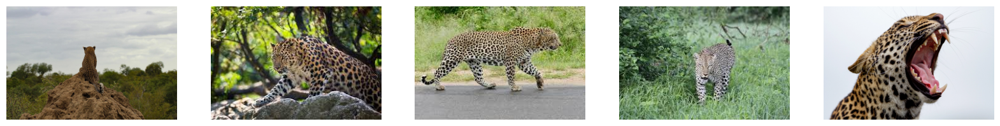

Class :  Tiger


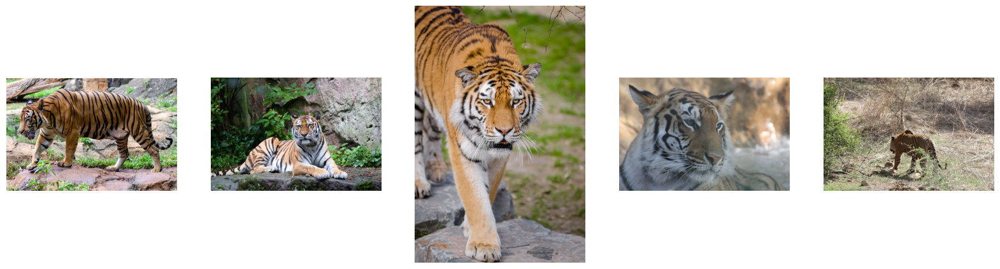

Class :  Cheetah


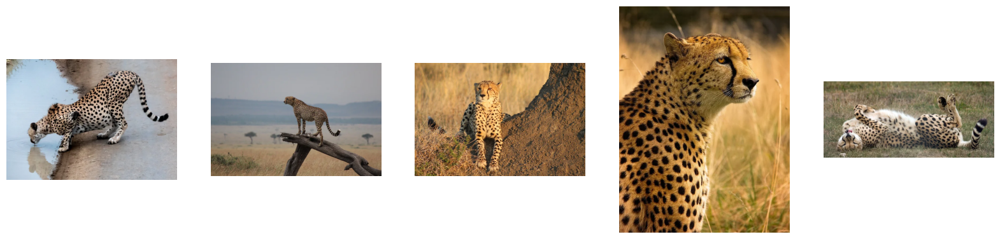

Class :  Lion


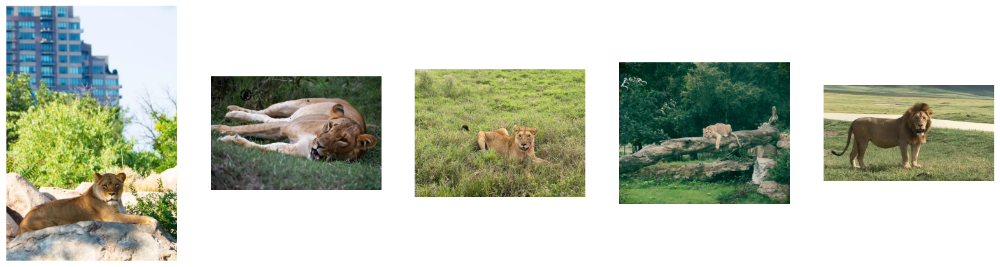

In [22]:
# Displays a visualization of the first 5 images from each class in the Train Set
plot_images(train_dir)

Class :  Puma


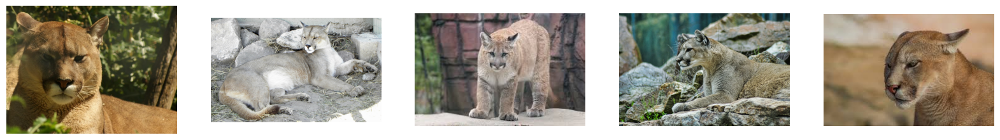

Class :  Leopard


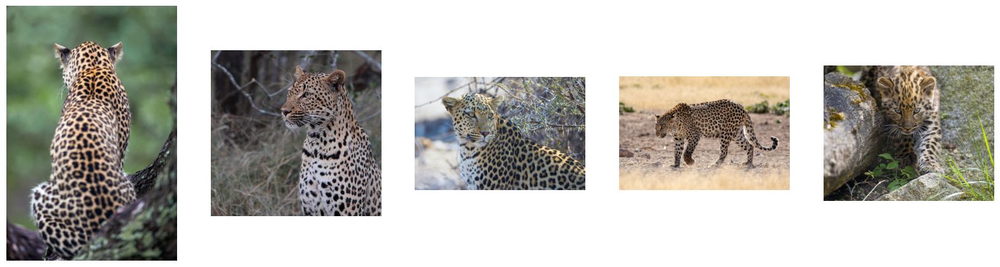

Class :  Tiger


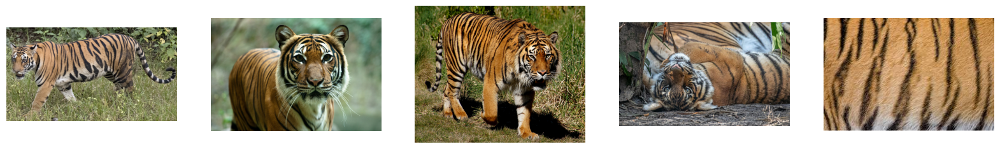

Class :  Cheetah


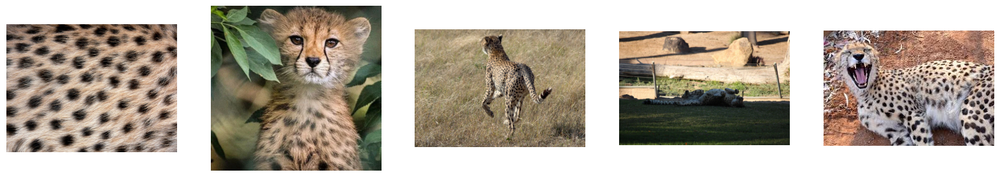

Class :  Lion


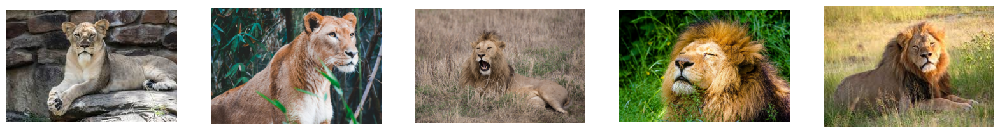

In [23]:
# Displays a visualization of the first 5 images from each class in the Test Set
plot_images(test_dir)

Class :  Puma


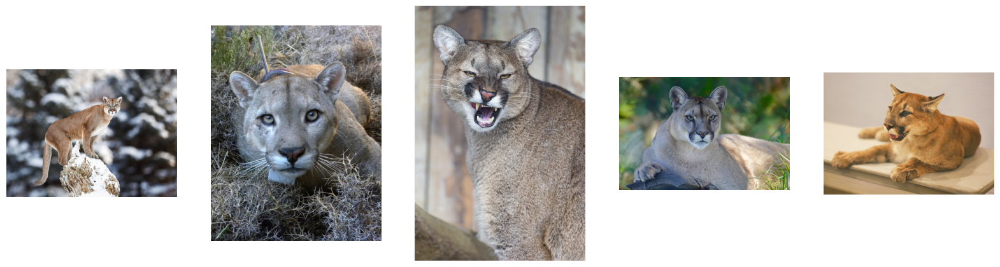

Class :  Leopard


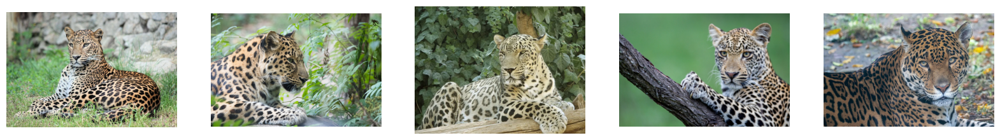

Class :  Tiger


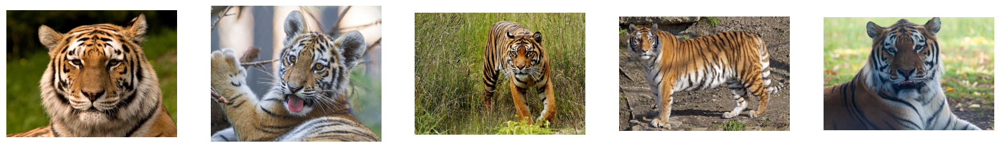

Class :  Cheetah


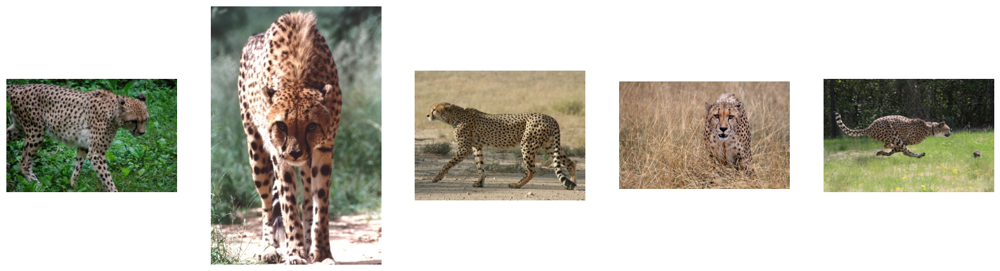

Class :  Lion


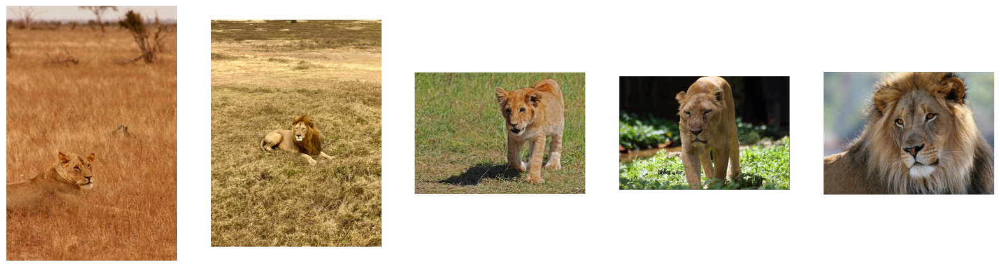

In [49]:
# Displays a visualization of the first 5 images from each class in the Val Set
plot_images(val_dir)

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:10px;">**6. ANN Training**</p>

Modeling without Data Augmentation

## **6.1 Preprocessing**

In [38]:
# Define hyperparameters
img_height= 220
img_width= 220
batch_size= 64

In [39]:
# Create batch generator for train-set, val-set, and test-set
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                                                validation_split=0.4)

train_set = train_datagen.flow_from_directory(train_dir,
                                              target_size=(img_height,img_width),
                                              class_mode='sparse',
                                              subset='training',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=2)

val_set = train_datagen.flow_from_directory(val_dir,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            subset='validation',
                                            batch_size=batch_size,
                                            shuffle=True,
                                            seed=2)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

test_set = test_datagen.flow_from_directory(test_dir,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=False,
                                            seed=2)

Found 103 images belonging to 5 classes.
Found 14 images belonging to 5 classes.
Found 35 images belonging to 5 classes.


In [40]:
# Show labels
train_set.class_indices

{'Cheetah': 0, 'Leopard': 1, 'Lion': 2, 'Puma': 3, 'Tiger': 4}

## **6.2 Model Definition**

### **6.2.1 Model Sequential**

In [42]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# Create Sequential API model
model_seq = Sequential()

# Convolution Architechture
model_seq.add(Conv2D(32, (3,3), activation='relu', input_shape=(img_height, img_width,3)))
model_seq.add(MaxPooling2D(2, 2))
model_seq.add(Conv2D(64, (3,3), activation='relu'))
model_seq.add(MaxPooling2D(2, 2))
model_seq.add(Conv2D(128, (3,3),activation='relu'))
model_seq.add(MaxPooling2D(2, 2))
model_seq.add(Conv2D(256, (3,3),activation='relu'))
model_seq.add(MaxPooling2D(2, 2))

# Architechture ANN biasa
model_seq.add(Flatten())
model_seq.add(Dropout(0.5))
model_seq.add(Dense(512, activation='relu'))
model_seq.add(Dense(5, activation='softmax'))

# Compile
model_seq.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model_seq.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 218, 218, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 109, 109, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 107, 107, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 53, 53, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 51, 51, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 25, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 23, 23, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 11, 11, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    15,860,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,251,205 (61.99 MB)

 Trainable params: 16,251,205 (61.99 MB)

 Non-trainable params: 0 (0.00 B)

**Explanation :**  

This Sequential base model has a Convolutional model with 4 layers, the first layer has 32 filters, the second layer has 64 filters, the third layer has 128 filters, and the fourth layer has 256 filters. With a kernel size of 3x3 and using the ReLU activation function, followed by a Max Pooling Layer with a pooling size of 2x2.

Then, the output from Convolutional Layer 4 is flattened and given a Dropout with a dropout rate of 0.5 to reduce overfitting.

Next, the data is processed through a Dense Layer with 512 units and the ReLU activation function, before finally being grouped into 5 classes through the final Dense Layer with the softmax activation function.

The model is then compiled with the sparse_categorical_crossentropy loss function, adam optimizer, and accuracy metrics.

In [ ]:
# Plot layers
tf.keras.utils.plot_model(model_seq, show_shapes=False)

In [45]:
# Train the model
history_seq = model_seq.fit(train_set,
                            epochs=25,
                            validation_data = val_set,
                            batch_size=batch_size)

Epoch 1/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 9s 4s/step - accuracy: 0.1678 - loss: 2.3010 - val_accuracy: 0.3571 - val_loss: 1.9798
Epoch 2/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.2595 - loss: 1.8306 - val_accuracy: 0.2143 - val_loss: 1.6209
Epoch 3/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 3s/step - accuracy: 0.2439 - loss: 1.6033 - val_accuracy: 0.2143 - val_loss: 1.5966
Epoch 4/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.2867 - loss: 1.5955 - val_accuracy: 0.2857 - val_loss: 1.5716
Epoch 5/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 3s/step - accuracy: 0.2771 - loss: 1.5885 - val_accuracy: 0.4286 - val_loss: 1.5499
Epoch 6/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.3672 - loss: 1.5541 - val_accuracy: 0.2143 - val_loss: 1.5646
Epoch 7/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.2750 - loss: 1.5327 - val_accuracy: 0.4286 - val_loss: 1.4372
Epoch 8/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 3s/step - accuracy: 0.4236 - loss: 1.4714 - val_accuracy: 0.6429 - val_loss: 1.3016
Epoch 9/25
2/2 ━

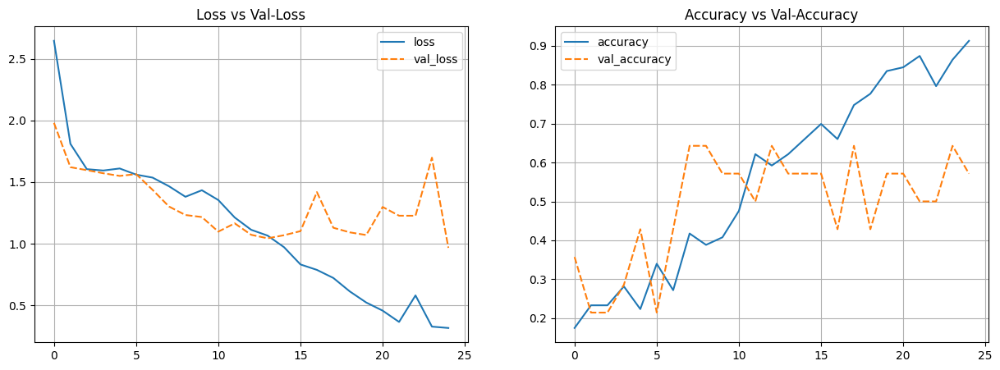

In [46]:
# Model Evaluation

# Plot training results
history_seq_df = pd.DataFrame(history_seq.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_seq_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_seq_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [48]:
# Check the performance of test-set

# Get the probability
y_pred_prob_seq = model_seq.predict(test_set)

# Get class with maximum probability
y_pred_class_seq = np.argmax(y_pred_prob_seq, axis=-1)

# Display Classification Report
print(classification_report(test_set.classes, y_pred_class_seq, target_names=np.array(list(train_set.class_indices.keys()))))

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
              precision    recall  f1-score   support

     Cheetah       0.33      0.12      0.18         8
     Leopard       0.38      0.71      0.50         7
        Lion       0.43      0.43      0.43         7
        Puma       0.33      0.17      0.22         6
       Tiger       0.33      0.43      0.38         7

    accuracy                           0.37        35
   macro avg       0.36      0.37      0.34        35
weighted avg       0.36      0.37      0.34        35



**Explanation :**  

The basic Sequential model has an Accuracy score of 0.37.
The model has good performance in identifying Class Leopard and Lion, and has quite good performance in identifying Class Tiger, but has difficulty in recognizing Class Puma and Cheetah.

### **6.2.2 - Model Functional**

In [50]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# Define the input layer
inputs = Input(shape=(img_height, img_width, 3))

# Branch 1
x = layers.Conv2D(32, kernel_size=(2, 2), activation='relu')(inputs)
x = layers.MaxPool2D(pool_size=(2, 2), padding='same')(x)

# Branch 2
y = layers.Conv2D(64, kernel_size=(2, 2), activation='relu')(inputs)
y = layers.MaxPool2D(pool_size=(2, 2), padding='same')(y)

# Concatenate branches
merged = layers.concatenate([x, y])

# Dense layer after concatenation
merged = layers.Dense(128, activation='relu')(merged)

# Branch 3
x = layers.Conv2D(128, kernel_size=(3, 3), activation='relu')(merged)
x = layers.MaxPool2D(pool_size=(2, 2), padding='same')(x)

# Branch 4
y = layers.Conv2D(256, kernel_size=(3, 3), activation='relu')(merged)
y = layers.MaxPool2D(pool_size=(2, 2), padding='same')(y)

# Concatenate branches using functional API
merged = layers.concatenate([x, y])

# Dense layer after concatenation
merged = layers.Dense(units=256, activation='relu')(merged)

# Flatten layer
merged = layers.Flatten()(merged)

# Dense layers for classification
merged = layers.Dense(256, activation='relu')(merged)
outputs = layers.Dense(5, activation='softmax')(merged)

# Create the model
model_func = Model(inputs, outputs)

# Compile
model_func.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Display model summary
model_func.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 220, 220,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 219, 219,  │        416 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 219, 219,  │        832 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 110, 110,  │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 110, 110,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 110, 110,  │          0 │ max_pooling2d[0]… │
│ (Concatenate)       │ 96)               │            │ max_pooling2d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 110, 110,  │     12,416 │ concatenate[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 108, 108,  │    147,584 │ dense[0][0]       │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 108, 108,  │    295,168 │ dense[0][0]       │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 54, 54,    │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 54, 54,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 54, 54,    │          0 │ max_pooling2d_2[… │
│ (Concatenate)       │ 384)              │            │ max_pooling2d_3[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 54, 54,    │     98,560 │ concatenate_1[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 746496)    │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 256)       │ 191,103,2… │ flatten[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 5)         │      1,285 │ dense_2[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 191,659,493 (731.12 MB)

 Trainable params: 191,659,493 (731.12 MB)

 Non-trainable params: 0 (0.00 B)

**Explanation :**  

The Functional base model has a Convolutional model with 4 layers, the first layer has 32, the second layer has 64 filters, the third layer has 128 filters, and the fourth layer has 256 filters. With a kernel size of 3x3 and using the ReLU activation function, followed by a max pooling layer with a pooling size of 2x2 and followed by a Max Pooling layer.

After that, the output of the four Convolutional Layers is flattened and given a Dense layer with 512 units and uses the ReLU activation function.

Next, the data is processed through the Dropout layer with a dropout rate of 0.5 to reduce overfitting.

Finally, the output of the dropout layer is concatenated in a final Dense layer with 10 units and uses a softmax activation function to produce the class output.

The model is then compiled with the sparse_categorical_crossentropy loss function, adam optimizer, and accuracy metrics.

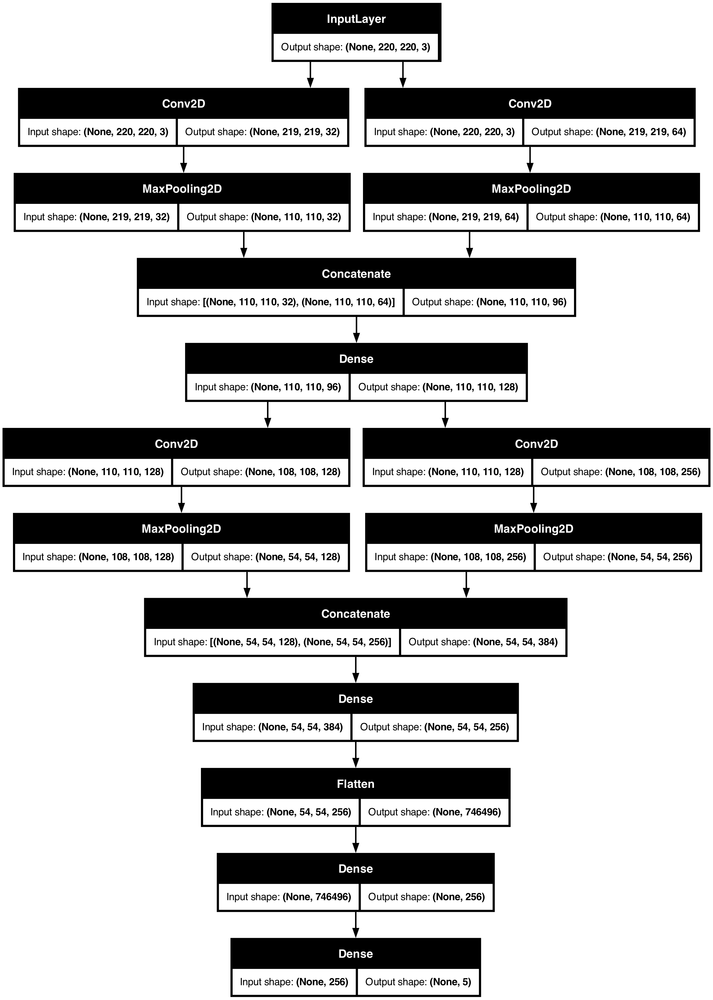

In [51]:
# Plot layers
tf.keras.utils.plot_model(model_func, show_shapes=True)

In [52]:
# Train the model
history_func = model_func.fit(train_set,
                            epochs=25,
                            validation_data = val_set,
                            batch_size=batch_size)

Epoch 1/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 44s 26s/step - accuracy: 0.1914 - loss: 26.4895 - val_accuracy: 0.2143 - val_loss: 20.1234
Epoch 2/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 39s 26s/step - accuracy: 0.2149 - loss: 13.2920 - val_accuracy: 0.2143 - val_loss: 4.0438
Epoch 3/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 38s 25s/step - accuracy: 0.2258 - loss: 3.2401 - val_accuracy: 0.3571 - val_loss: 1.8045
Epoch 4/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 36s 23s/step - accuracy: 0.3009 - loss: 1.6876 - val_accuracy: 0.2143 - val_loss: 1.6096
Epoch 5/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 35s 13s/step - accuracy: 0.1790 - loss: 1.6050 - val_accuracy: 0.4286 - val_loss: 1.4978
Epoch 6/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 34s 13s/step - accuracy: 0.4242 - loss: 1.4976 - val_accuracy: 0.4286 - val_loss: 1.4744
Epoch 7/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 31s 12s/step - accuracy: 0.5694 - loss: 1.4034 - val_accuracy: 0.3571 - val_loss: 1.3481
Epoch 8/25
2/2 ━━━━━━━━━━━━━━━━━━━━ 39s 23s/step - accuracy: 0.5119 - loss: 1.3386 - val_accuracy: 0.4286 - val_loss: 1.35

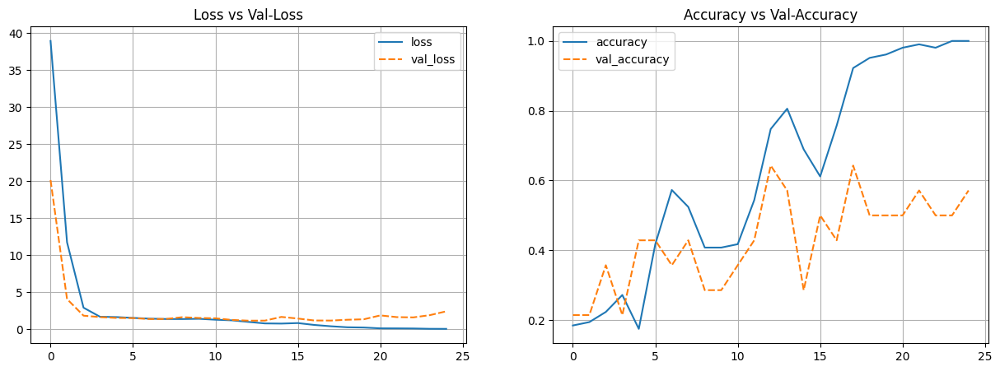

In [53]:
# Model Evaluation

# Plot training results
history_func_df = pd.DataFrame(history_func.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_func_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_func_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [55]:
# Check the performance of test-set

# Get the probability
y_pred_prob_func = model_func.predict(test_set)

# Get class with maximum probability
y_pred_class_func = np.argmax(y_pred_prob_func, axis=-1)

# Display Classification Report
print(classification_report(test_set.classes, y_pred_class_func, target_names=np.array(list(train_set.class_indices.keys()))))

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
              precision    recall  f1-score   support

     Cheetah       0.00      0.00      0.00         8
     Leopard       0.40      0.86      0.55         7
        Lion       0.33      0.29      0.31         7
        Puma       0.50      0.50      0.50         6
       Tiger       0.50      0.14      0.22         7

    accuracy                           0.34        35
   macro avg       0.35      0.36      0.32        35
weighted avg       0.33      0.34      0.30        35



**Explanation :**  

The basic Functional model has an Accuracy score of 0.34.  
The model performance tends to be poor. The model has the best performance in identifying Class Leopard and Puma, and has the worst performance in identifying Class Chetah.

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:10px;">**7. ANN Improvement**</p>
 
Modeling with Data Augmentation

## **7.1 Preprocessing**

In [56]:
# Create batch generator for train-set, val-set, and test-set

train_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                                                    rotation_range=30,
                                                                    zoom_range=0.2,
                                                                    width_shift_range=0.15,
                                                                    height_shift_range=0.15,
                                                                    shear_range=0.2,
                                                                    horizontal_flip=True,
                                                                    vertical_flip=True,
                                                                    fill_mode='nearest',
                                                                    validation_split=0.25)

train_set_aug = train_datagen_aug.flow_from_directory(train_dir,
                                                      target_size=(img_height,img_width),
                                                      class_mode='sparse',
                                                      subset='training',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=2)

val_set_aug = train_datagen_aug.flow_from_directory(val_dir,
                                                    target_size=(img_height,img_width),
                                                    class_mode='sparse',
                                                    subset='validation',
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=2)

test_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

test_set_aug = test_datagen_aug.flow_from_directory(test_dir,
                                                    target_size=(img_height,img_width),
                                                    class_mode='sparse',
                                                    batch_size=batch_size,
                                                    shuffle=False,
                                                    seed=2)

Found 129 images belonging to 5 classes.
Found 9 images belonging to 5 classes.
Found 35 images belonging to 5 classes.


## **7.2 Model Definition**

### **7.2.1 Model Sequential**

In [65]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# Create Sequential API model
model_seq_aug = Sequential()

# Convolution Architechture
model_seq_aug.add(Conv2D(32, (3,3), activation='relu', kernel_initializer='RandomNormal', input_shape=(img_height, img_width,3)))
model_seq_aug.add(MaxPooling2D(2, 2))
model_seq_aug.add(Conv2D(64, (3,3), activation='relu', kernel_initializer='RandomNormal'))
model_seq_aug.add(MaxPooling2D(2, 2))
model_seq_aug.add(Conv2D(128, (3,3),activation='relu', kernel_initializer='RandomNormal'))
model_seq_aug.add(MaxPooling2D(2, 2))
model_seq_aug.add(Conv2D(256, (3,3),activation='relu', kernel_initializer='RandomNormal'))
model_seq_aug.add(MaxPooling2D(2, 2))

model_seq_aug.add(Flatten())
model_seq_aug.add(Dropout(0.5))
model_seq_aug.add(Dense(512, activation='relu'))
model_seq_aug.add(Dense(5, activation='softmax'))

# Compile
model_seq_aug.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model_seq_aug.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 218, 218, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 109, 109, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 107, 107, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 53, 53, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 51, 51, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 25, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 23, 23, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 11, 11, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    15,860,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,251,205 (61.99 MB)

 Trainable params: 16,251,205 (61.99 MB)

 Non-trainable params: 0 (0.00 B)

**Explanation :**  

This Sequential model has a Convolutional model with 4 layers, the first layer has 32 filters, the second layer has 64 filters, the third layer has 128 filters, and the fourth layer has 256 filters. With a kernel size of 3x3, using the ReLU activation function and using the RandomNormal kernel initializer, then followed by a Max Pooling Layer with a pooling size of 2x2.

Then, the output from Convolutional Layer 4 is flattened and given a Dropout with a dropout rate of 0.5 to reduce overfitting.

Next, the data is processed through a Dense Layer with 512 units, the activation function using ReLU, and kernel initializer using RandomNormal, before finally being grouped into 5 classes through the final Dense Layer with the softmax activation function.

The model is then compiled with the sparse_categorical_crossentropy loss function, adam optimizer, and accuracy metrics.

In [ ]:
# Plot layers
tf.keras.utils.plot_model(model_seq_aug, show_shapes=True)

In [66]:
# Callback Definition
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history_seq_aug = model_seq_aug.fit(train_set_aug,
                            epochs=50,
                            validation_data = val_set_aug,
                            batch_size=batch_size,
                            callbacks=[early_stopping])

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - accuracy: 0.1701 - loss: 4.3588 - val_accuracy: 0.2222 - val_loss: 2.2102
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.2217 - loss: 1.9506 - val_accuracy: 0.2222 - val_loss: 1.6211
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 3s/step - accuracy: 0.1585 - loss: 1.7032 - val_accuracy: 0.2222 - val_loss: 1.5910
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - accuracy: 0.2082 - loss: 1.6055 - val_accuracy: 0.2222 - val_loss: 1.5777
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.2209 - loss: 1.5976 - val_accuracy: 0.2222 - val_loss: 1.5791
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - accuracy: 0.2054 - loss: 1.5963 - val_accuracy: 0.2222 - val_loss: 1.5949
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.2326 - loss: 1.5882 - val_accuracy: 0.2222 - val_loss: 1.6147
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.2608 - loss: 1.5948 - val_accuracy: 0.3333 - val_loss: 1.5944
Epoch 9/50
3/3

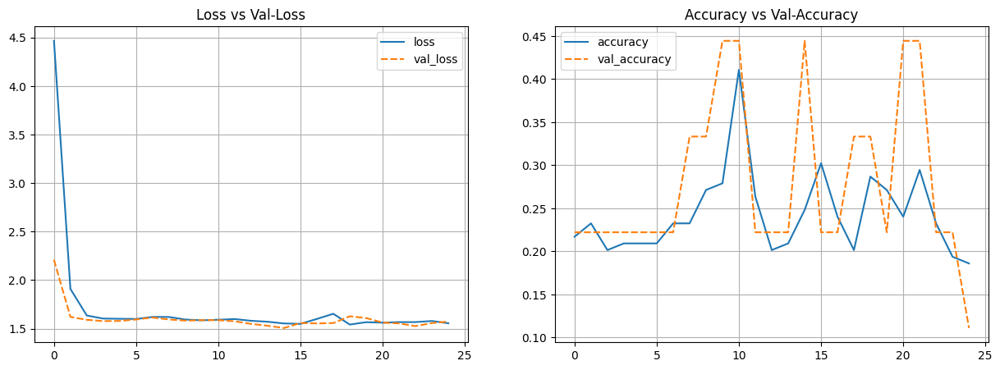

In [67]:
# Model Evaluation

# Plot training results

history_seq_aug_df = pd.DataFrame(history_seq_aug.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_seq_aug_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_seq_aug_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [68]:
# Check the performance of test-set

## Get the probability
y_pred_prob_seq_aug = model_seq_aug.predict(test_set_aug)

## Get class with maximum probability
y_pred_class_seq_aug = np.argmax(y_pred_prob_seq_aug, axis=-1)

## Display Classification Report
print(classification_report(test_set_aug.classes, y_pred_class_seq_aug, target_names=np.array(list(train_set_aug.class_indices.keys()))))

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
              precision    recall  f1-score   support

     Cheetah       0.00      0.00      0.00         8
     Leopard       0.29      1.00      0.45         7
        Lion       0.00      0.00      0.00         7
        Puma       0.00      0.00      0.00         6
       Tiger       0.40      0.29      0.33         7

    accuracy                           0.26        35
   macro avg       0.14      0.26      0.16        35
weighted avg       0.14      0.26      0.16        35



**Evaluation :**  

The Improvement Sequential model has an Accuracy score of 0.26.  
The model performance tends to be poor. The model has the best performance in identifying Class Leopard and Tiger, and cannot identifying Class Chetah, Lion, and Puma.

### **7.2.2 Model Functional**

In [69]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# Define the input layer
inputs = Input(shape=(img_height, img_width, 3))

# Branch 1
x = layers.Conv2D(32, kernel_size=(2, 2), activation='relu', kernel_initializer='RandomNormal')(inputs)
x = layers.MaxPool2D(pool_size=(2, 2), padding='same')(x)

# Branch 2
y = layers.Conv2D(64, kernel_size=(2, 2), activation='relu', kernel_initializer='RandomNormal')(inputs)
y = layers.MaxPool2D(pool_size=(2, 2), padding='same')(y)

# Concatenate branches
merged = layers.concatenate([x, y])

# Dense layer after concatenation
merged = layers.Dense(128, activation='relu', kernel_initializer='RandomNormal')(merged)

# Branch 3
x = layers.Conv2D(128, kernel_size=(3, 3), activation='relu', kernel_initializer='RandomNormal')(merged)
x = layers.MaxPool2D(pool_size=(2, 2), padding='same')(x)

# Branch 4
y = layers.Conv2D(128, kernel_size=(3, 3), activation='relu', kernel_initializer='RandomNormal')(merged)
y = layers.MaxPool2D(pool_size=(2, 2), padding='same')(y)

# Concatenate branches using functional API
merged = layers.concatenate([x, y])

# Dense layer after concatenation
merged = layers.Dense(units=256, activation='relu')(merged)

# Flatten layer
merged = layers.Flatten()(merged)

# Dense layers for classification
merged = layers.Dense(256, activation='relu')(merged)
outputs = layers.Dense(5, activation='softmax')(merged)

# Create the model
model_func_aug = Model(inputs, outputs)

# Compile
model_func_aug.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Display model summary
model_func_aug.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 220, 220,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 219, 219,  │        416 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 219, 219,  │        832 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 110, 110,  │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 110, 110,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 110, 110,  │          0 │ max_pooling2d[0]… │
│ (Concatenate)       │ 96)               │            │ max_pooling2d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 110, 110,  │     12,416 │ concatenate[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 108, 108,  │    147,584 │ dense[0][0]       │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 108, 108,  │    147,584 │ dense[0][0]       │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 54, 54,    │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 54, 54,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 54, 54,    │          0 │ max_pooling2d_2[… │
│ (Concatenate)       │ 256)              │            │ max_pooling2d_3[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 54, 54,    │     65,792 │ concatenate_1[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 746496)    │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 256)       │ 191,103,2… │ flatten[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 5)         │      1,285 │ dense_2[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 191,479,141 (730.43 MB)

 Trainable params: 191,479,141 (730.43 MB)

 Non-trainable params: 0 (0.00 B)

**Explanation :**  

The Improvement Functional model has a Convolutional model with 4 layers, the first layer has 32, the second layer has 64 filters, the third layer has 128 filters, and the fourth layer has 256 filters. With a kernel size of 3x3, using the ReLU activation function, and using a RandomNormal initializer kernel, followed by a max pooling layer with a pooling size of 2x2 and followed by a Max Pooling layer.

After that, the output of the four Convolutional Layers is flattened and given a Dense layer with 512 units and uses the ReLU activation function.

Next, the data is processed through the Dropout layer with a dropout rate of 0.5 to reduce overfitting.

Finally, the output of the dropout layer is concatenated in a final Dense layer with 10 units and uses a softmax activation function to produce the class output.

The model is then compiled with the sparse_categorical_crossentropy loss function, adam optimizer, and accuracy metrics.

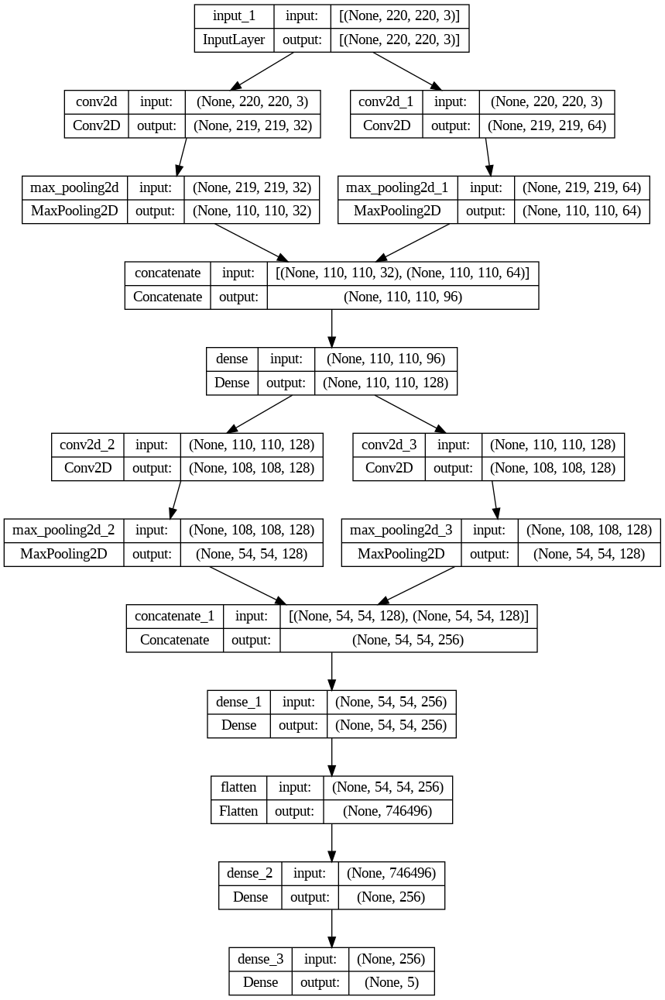

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model_func_aug, show_shapes=True)

In [70]:
# Callback Definition
early_stopping = EarlyStopping(monitor='accuracy', patience=5, restore_best_weights=True)

# Train the model
history_func_aug = model_func_aug.fit(train_set_aug,
                            epochs=50,
                            validation_data = val_set_aug,
                            batch_size=batch_size,
                            callbacks=[early_stopping])

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 41s 8s/step - accuracy: 0.1556 - loss: 9.8604 - val_accuracy: 0.2222 - val_loss: 3.0627
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 8s/step - accuracy: 0.2015 - loss: 3.1379 - val_accuracy: 0.2222 - val_loss: 2.2637
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 31s 8s/step - accuracy: 0.2054 - loss: 2.1479 - val_accuracy: 0.2222 - val_loss: 1.6307
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 35s 8s/step - accuracy: 0.2315 - loss: 1.6078 - val_accuracy: 0.1111 - val_loss: 1.6584
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 32s 13s/step - accuracy: 0.2204 - loss: 1.6590 - val_accuracy: 0.2222 - val_loss: 1.6796
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 29s 7s/step - accuracy: 0.2093 - loss: 1.6837 - val_accuracy: 0.2222 - val_loss: 1.6025
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 29s 7s/step - accuracy: 0.2024 - loss: 1.6276 - val_accuracy: 0.2222 - val_loss: 1.6996
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 30s 12s/step - accuracy: 0.1507 - loss: 1.7590 - val_accuracy: 0.2222 - val_loss: 1.6098
Epoch 

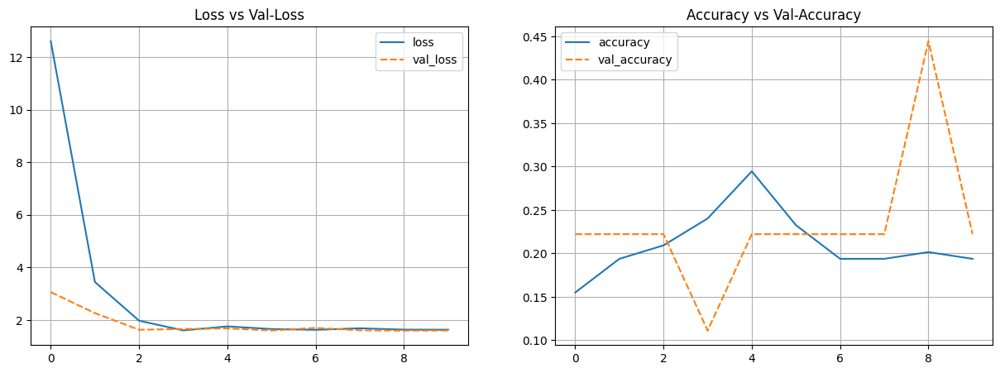

In [71]:
# Model Evaluation

# Plot training results

history_func_aug_df = pd.DataFrame(history_func_aug.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_func_aug_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_func_aug_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [73]:
# Check the performance of test-set

## Get the probability
y_pred_prob_func_aug = model_func_aug.predict(test_set_aug)

## Get class with maximum probability
y_pred_class_func_aug = np.argmax(y_pred_prob_func_aug, axis=-1)

## Display Classification Report
print(classification_report(test_set_aug.classes, y_pred_class_func_aug, target_names=np.array(list(train_set_aug.class_indices.keys()))))

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
              precision    recall  f1-score   support

     Cheetah       0.00      0.00      0.00         8
     Leopard       0.00      0.00      0.00         7
        Lion       0.18      0.86      0.30         7
        Puma       0.00      0.00      0.00         6
       Tiger       0.00      0.00      0.00         7

    accuracy                           0.17        35
   macro avg       0.04      0.17      0.06        35
weighted avg       0.04      0.17      0.06        35



**Explanation:**

The Functional Improvement model has an Accuracy score of 0.26.
Model performance tends to be poor.
The model has the best performance in identifying Class Lion, and cannot identify Class Cheetah, Leopard, Puma, and Tiger.

### **7.2.3 Model Transfer Learning**

In [88]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# Load pre-trained VGG16 model
vgg16 = VGG16(input_shape=(220, 220, 3), weights='imagenet', include_top=False)

# Freeze all layers in VGG16
for layer in vgg16.layers:
    layer.trainable = False

# Create a new model on top of the pre-trained VGG16
x = Flatten()(vgg16.output)
x = Dense(512, activation='relu')(x)
predictions = Dense(5, activation='softmax')(x)

# Combine the base model and new layers
model_tl = Model(inputs=vgg16.input, outputs=predictions)

# Compile the model
model_tl.compile(optimizer='rmsprop',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

# Display the model summary
model_tl.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 220, 220, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 220, 220, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 220, 220, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 110, 110, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 110, 110, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 110, 110, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 55, 55, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 55, 55, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 55, 55, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 55, 55, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 27, 27, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 27, 27, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 27, 27, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 27, 27, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 13, 13, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 13, 13, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 13, 13, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 13, 13, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 6, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     9,437,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,154,949 (92.14 MB)

 Trainable params: 9,440,261 (36.01 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [89]:
# Callback Definition
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history_tl = model_tl.fit(train_set_aug,
                            epochs=50,
                            validation_data = val_set_aug,
                            batch_size=batch_size,
                            callbacks=[early_stopping])

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 22s 5s/step - accuracy: 0.1323 - loss: 15.5335 - val_accuracy: 0.2222 - val_loss: 31.8747
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 9s/step - accuracy: 0.1741 - loss: 23.7499 - val_accuracy: 0.2222 - val_loss: 13.8916
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 9s/step - accuracy: 0.1857 - loss: 7.4757 - val_accuracy: 0.2222 - val_loss: 2.4680
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 5s/step - accuracy: 0.2762 - loss: 2.5670 - val_accuracy: 0.2222 - val_loss: 6.0430
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 9s/step - accuracy: 0.4473 - loss: 3.5817 - val_accuracy: 0.4444 - val_loss: 1.4066
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 6s/step - accuracy: 0.3876 - loss: 2.1298 - val_accuracy: 0.5556 - val_loss: 2.1853
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 5s/step - accuracy: 0.3599 - loss: 2.0314 - val_accuracy: 0.1111 - val_loss: 3.3429
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 5s/step - accuracy: 0.3247 - loss: 2.2640 - val_accuracy: 0.2222 - val_loss: 4.5716
Epoc

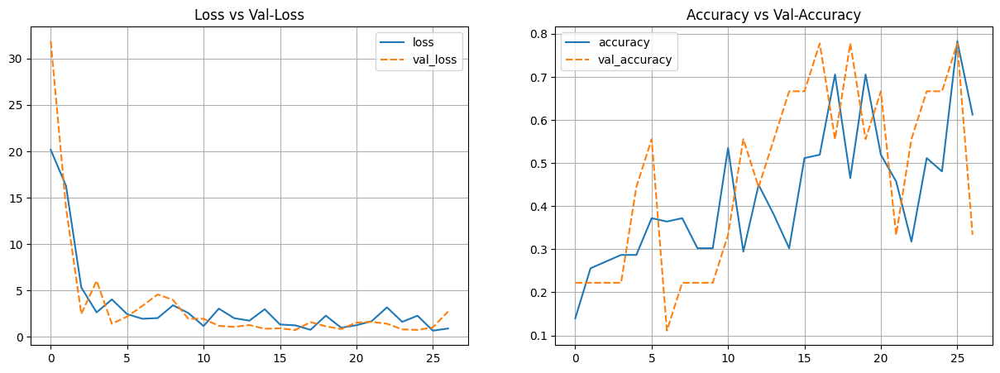

In [90]:
# Model Evaluation

# Plot training results

history_tl_df = pd.DataFrame(history_tl.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_tl_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_tl_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [91]:
# Check the performance of test-set

## Get the probability
y_pred_prob_tl = model_tl.predict(test_set_aug)

## Get class with maximum probability
y_pred_class_tl = np.argmax(y_pred_prob_tl, axis=-1)

## Display Classification Report
print(classification_report(test_set_aug.classes, y_pred_class_tl, target_names=np.array(list(train_set_aug.class_indices.keys()))))

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
              precision    recall  f1-score   support

     Cheetah       1.00      0.38      0.55         8
     Leopard       0.64      1.00      0.78         7
        Lion       0.60      0.86      0.71         7
        Puma       0.80      0.67      0.73         6
       Tiger       1.00      0.86      0.92         7

    accuracy                           0.74        35
   macro avg       0.81      0.75      0.74        35
weighted avg       0.81      0.74      0.73        35



**Explanation:**

The Transfer Learning model has an Accuracy score of 0.74.
The model has the best performance in identifying Class Tiger, has quite good performance in identifying Class Leopard, Lion, and Puma, and had the worst performance at identifying Class Cheetah.

**Conclusion**  

Of the five models, the model that has the best performance is the model with transfer learning, so this model will be saved.

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:10px;">**8. Model Saving**</p>

In [144]:
# Save model
model_tl.save('model.h5')

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:10px;">**9. Model Inference**</p>

In [145]:
# Load model
model = load_model('model.h5')

In [155]:
# Variable to store the path to the directory containing the inference image
drive_path = 'Inference'

data = []
imgf = ['jpg', 'jpeg', 'png', 'webp']

# Iterates over all files in a directory
for filename in os.listdir(drive_path):
    # Checks whether the file extension is included in the list of desired image extensions
    if any(filename.lower().endswith(ext) for ext in imgf):
        data.append(os.path.join(drive_path, filename))

# Create a DataFrame from a list of data with the column name 'image'
data_df = pd.DataFrame(data, columns=['image'])
data_df

,image
0,Inference/Tiger_035.jpg
1,Inference/Cheetah_048.jpg


In [147]:
def image_preprocessing(data):
    # Hyperparameters
    img_height = 220
    img_width = 220
    batch_size = 64

    image_array = []
    # Convert to array
    for i in data['image'].values:
        img = tf.keras.utils.load_img(i)
        image_array.append(tf.keras.preprocessing.image.img_to_array(img))

    # Resize the image
    new_image = []
    for i in image_array:
        new_image.append(np.array(tf.image.resize(i, (img_height, img_width))))
    new_image = np.array(new_image)
    return new_image

In [156]:
new_image = image_preprocessing(data_df)

In [141]:
class AnimalClassifier:
    def __init__(self):
        self.class_mapping = {0: 'Cheetah', 1: 'Leopard', 2: 'Lion', 3: 'Puma', 4: 'Tiger'}
        self.unknown_class = 'Unknown'

    def model_pred(self, model, feature):
        pred = model.predict(feature)
        index = []
        for i in pred:
            index.append(np.argmax(i) if i[np.argmax(i)] > 0.5 else len(self.class_mapping))

        # Convert the index to a class name using the specified mapping
        index = [self.class_mapping.get(i, self.unknown_class) for i in index]

        return index

In [157]:
classifier = AnimalClassifier()

In [158]:
predictions = classifier.model_pred(model, new_image)
predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


['Tiger', 'Cheetah']

**Explanation :**  

The model succeeded in capturing this inference data according to its class.

# <p style="background-color:#FFC0CB;font-family:newtimeroman;color:#222021;font-size:130%;text-align:center;border-radius:10px 10px;margin-bottom:10px;">**10. Conclusion**</p>

The metric used is Accuracy because it is expected to provide an overall picture of how well the model performs in classifying all classes in the dataset. This provides useful information about how good the model is.

The best model chosen was the Transfer Learning Model with an Accuracy score of 0.74.  

- The Disadvantages of the model:
The accuracy value of the model is still quite low.
The model is sensitive to changes in scale and rotation, the model is unable to recognize the same object at different scales or orientations.

- The advantages of the model:
Capable of automatically extracting features from images without requiring features to be extracted manually. This allows the model to learn better representations from image data.
And the use of dropout layers can help reduce overfitting by randomly turning off some units at each training iteration, thereby preventing too strong dependence on certain units.

- Improvement statement from the model:
It is possible to add data by increasing data for classes that have low support, which can help the model to learn better patterns.
To overcome imbalance data, you can use other metrics that are more resistant to imbalance data so that the model can work better.